In [1]:
%reload_ext nb_black

<IPython.core.display.Javascript object>

In [2]:
import pickle

import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

%matplotlib inline

from tqdm.notebook import tqdm

from scipy import stats

from sklearn.cluster import DBSCAN, KMeans
from sklearn.metrics import confusion_matrix, classification_report, silhouette_score


from scipy.stats.mstats import winsorize

from sklearn.decomposition import PCA
import umap
from sklearn import metrics

from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import NearestNeighbors

from xgboost import XGBClassifier

from sklearn.preprocessing import StandardScaler, OneHotEncoder, MinMaxScaler
from category_encoders import LeaveOneOutEncoder

from sklearn.ensemble import RandomForestClassifier

import plotly.graph_objects as go
from plotly.subplots import make_subplots
from scipy import stats



<IPython.core.display.Javascript object>

In [3]:
# use this to know Statistically significant features per cluster.
def main_features(i):
    # for i in range(0, len(cluster_list) - 1):
    # Isolate cluster data
    cluster_list = list(set(clst.labels_))
    dfm["label"] = clst.labels_
    cluster = dfm[dfm["label"] == cluster_list[i]]
    other = dfm[dfm["label"] != cluster_list[i]]
    # Drop non numeric columns
    cluster = cluster.drop(columns=["label", "ticker"], errors="ignore")
    other = other.drop(columns=["label", "ticker"], errors="ignore")
    print(
        "Reviewing cluster number:",
        cluster_list[i],
        "\n",
        "\nFeatures that are statistically significant;\n",
    )
    for j in range(0, len(cluster.columns)):
        c = cluster[cluster.columns[j]]
        o = other[other.columns[j]]
        # Run Ttest
        t, p = stats.ttest_ind(a=c, b=o, equal_var=False)
        if p < 0.05:
            print(f"{cluster.columns[j]}")


# Discover Clusters with a simple function.
def fyi_cluster(cluster_num, feat):

    view_cluster = labeled_df[labeled_df["label"] == cluster_num]
    feat = feat

    print(
        "-----------------------\n",
        f"Now Presenting Details for Cluster {cluster_num}\n",
    )
    print("These are the stock symbols for the cluster:")
    display(view_cluster["ticker"].unique())
    print("\n", "Each Ticker that has less than 19 has moved clusters from here:")
    display(view_cluster["ticker"].value_counts().head(10))
    print("\n", f"Top 5 and Bottom 5 by {feat}:")
    display(view_cluster.sort_values(by=feat, ascending=False).head().T)
    print("\n", f"Bottom 5 stocks by {feat} in cluster:")
    display(view_cluster.sort_values(by=feat, ascending=False).tail().T)

<IPython.core.display.Javascript object>

## Data Import, 

In [4]:
data = "data/fund.csv"
data_def = "data/SHARADAR_INDICATORS_a3407c5c2ec46991d2b7ac667785d0d1.csv"
fin_data = pd.read_csv(data)
df = fin_data.copy()
defs = pd.read_csv(data_def)

<IPython.core.display.Javascript object>

## Bring in Feature Name Key and Descriptions,

In [5]:
cols = list(df.columns)
# Create a df mapping definitions to df list.
defis = defs[["indicator", "title", "description"]]
defis = defis[defis.indicator.isin(cols)]
defis = defis.drop_duplicates()

defis.style.set_properties(subset=["description"], **{"width-min": "300px"})

,indicator,title,description
0,revenue,Revenues,[Income Statement] Amount of Revenue recognized from goods sold; services rendered; insurance premiums; or other activities that constitute an earning process. Interest income for financial institutions is reported net of interest expense and provision for credit losses.
12,netinccmn,Net Income Common Stock,[Income Statement] The amount of net income (loss) for the period due to common shareholders. Typically differs from [NetInc] to the parent entity due to the deduction of [PrefDivIS].
15,shareswa,Weighted Average Shares,[Income Statement] The weighted average number of shares or units issued and outstanding that are used by the company to calculate [EPS]; determined based on the timing of issuance of shares or units in the period.
25,ncfo,Net Cash Flow from Operations,[Cash Flow Statement] A component of [NCF] representing the amount of cash inflow (outflow) from operating activities; from continuing and discontinued operations.
30,assets,Total Assets,[Balance Sheet] Sum of the carrying amounts as of the balance sheet date of all assets that are recognized. Major components are [CashnEq]; [Investments];[Intangibles]; [PPNENet];[TaxAssets] and [Receivables].
31,cashneq,Cash and Equivalents,[Balance Sheet] A component of [Assets] representing the amount of currency on hand as well as demand deposits with banks or financial institutions.
33,investmentsc,Investments Current,[Balance Sheet] The current portion of [Investments]; reported if the company operates a classified balance sheet that segments current and non-current assets.
40,receivables,Trade and Non-Trade Receivables,[Balance Sheet] A component of [Assets] representing trade and non-trade receivables.
44,equity,Shareholders Equity,[Balance Sheet] A principal component of the balance sheet; in addition to [Liabilities] and [Assets]; that represents the total of all stockholders' equity (deficit) items; net of receivables from officers; directors; owners; and affiliates of the entity which are attributable to the parent.
47,assetsc,Current Assets,[Balance Sheet] The current portion of [Assets]; reported if a company operates a classified balance sheet that segments current and non-current assets.


<IPython.core.display.Javascript object>

### Initial look at df,
    - drop Q4 2020 data as most companies have not reported yet. 

In [6]:
# df.info()
df.head()

,ticker,revenue,pb,debt,assets,netmargin,ncfo,shareswa,sps,opinc,...,calendardate,datekey,sharesbas,equity,receivables,investmentsc,cashneq,assetsavg,netinccmn,fcfps
0,ZYME,2643000.0,4.916,7851000.0,571719000.0,-27.454,-16057000.0,50903633.0,0.052,-73694000.0,...,2020-09-30,2020-09-30,45627264.0,432354000.0,3692000.0,227737000.0,244120000.0,545838750.0,-214903000.0,-2.854
1,ZYME,12359000.0,3.344,8486000.0,606853000.0,-3.152,-49956000.0,50788681.0,0.243,-40349000.0,...,2020-06-30,2020-06-30,45539805.0,491253000.0,14825000.0,217220000.0,219569000.0,502918250.0,-172816000.0,-2.792
2,ZYME,8269000.0,3.091,9007000.0,636578000.0,-3.765,-37487000.0,48686718.0,0.170,-35880000.0,...,2020-03-31,2020-03-31,45518869.0,522419000.0,8653000.0,298179000.0,189485000.0,454841750.0,-162932000.0,-2.154
3,ZYME,1877000.0,7.288,6881000.0,368205000.0,-38.489,-36354000.0,43658717.0,0.043,-73752000.0,...,2019-12-31,2019-12-31,39387339.0,245681000.0,2185000.0,170453000.0,128451000.0,355267000.0,-145437000.0,-2.319
4,ZYME,7860000.0,3.146,6755000.0,400037000.0,-3.877,-10880000.0,43445379.0,0.181,-33564000.0,...,2019-09-30,2019-09-30,39259938.0,309525000.0,3420000.0,84259000.0,250844000.0,324335000.0,-63920000.0,0.004


<IPython.core.display.Javascript object>

In [7]:
display(df.shape)
df = df[df["calendardate"] != "2020-12-31"]
df = df.dropna()
df.shape

(35053, 23)

(25130, 23)

<IPython.core.display.Javascript object>

## Prepare Features for modeling,
    - Need to normalize features -- will make them all ratios.
        - first per share.
        - then create financial and profitability ratios.

In [8]:
# set copy of df
dfs = df.copy()

<IPython.core.display.Javascript object>

In [9]:
# set sum feature to a per share metric.
# scale features down by shareswa vol.
cols = [
    "revenue",
    "debt",
    "assets",
    "opinc",
    "assetsc",
    "liabilitiesc",
    "equity",
    "receivables",
    "investmentsc",
    "cashneq",
    "assetsavg",
    "netinccmn",
]

for col in df[cols]:
    dfs[col] = dfs[col] / dfs["shareswa"]

dfs.head()

,ticker,revenue,pb,debt,assets,netmargin,ncfo,shareswa,sps,opinc,...,calendardate,datekey,sharesbas,equity,receivables,investmentsc,cashneq,assetsavg,netinccmn,fcfps
0,ZYME,0.051922,4.916,0.154233,11.231399,-27.454,-16057000.0,50903633.0,0.052,-1.447716,...,2020-09-30,2020-09-30,45627264.0,8.493578,0.072529,4.473885,4.795728,10.722982,-4.221762,-2.854
1,ZYME,0.243342,3.344,0.167084,11.948588,-3.152,-49956000.0,50788681.0,0.243,-0.794449,...,2020-06-30,2020-06-30,45539805.0,9.672490,0.291896,4.276937,4.323188,9.902172,-3.402648,-2.792
2,ZYME,0.169841,3.091,0.184999,13.074983,-3.765,-37487000.0,48686718.0,0.170,-0.736957,...,2020-03-31,2020-03-31,45518869.0,10.730216,0.177728,6.124442,3.891924,9.342214,-3.346539,-2.154
3,ZYME,0.042993,7.288,0.157609,8.433711,-38.489,-36354000.0,43658717.0,0.043,-1.689285,...,2019-12-31,2019-12-31,39387339.0,5.627307,0.050047,3.904215,2.942162,8.137367,-3.331225,-2.319
4,ZYME,0.180917,3.146,0.155483,9.207815,-3.877,-10880000.0,43445379.0,0.181,-0.772556,...,2019-09-30,2019-09-30,39259938.0,7.124463,0.078720,1.939424,5.773779,7.465351,-1.471273,0.004


<IPython.core.display.Javascript object>

### Creating Ratios,
    - using financial and profitability ratios from, 
[accountingverse.com](https://www.accountingverse.com/managerial-accounting/fs-analysis/financial-ratios.html)

In [10]:
# Quick Ratio =  cash, marketable securities, receivables divided by current liabilities.
# Ratios higher than 1 are a good indicator of fiscal strength.

dfs["quick"] = (dfs["cashneq"] + dfs["investmentsc"] + dfs["receivables"]) / dfs[
    "liabilitiesc"
]

# Return on Assets = NetIncome / Assets
# ROA gives an indication of the capital intensity of the company, which will depend on the industry.
# That's why when using ROA as a comparative measure, it is best to compare it against a company's previous ROA
# figures or the ROA of a similar company.

# multiply by 1000 to give more equitable weighting when scaling
dfs["roa"] = (dfs["netinccmn"] / dfs["assets"]) * 1000

# Return on Equity = Net Income / Equity
# Higher values are generally favorable, meaning that the company is efficient in generating
# income on new investment.
# But note that a higher ROE does not necessarily mean better financial performance of the company.

dfs["roe"] = dfs["netinccmn"] / dfs["equity"]

# Return on Sales = Net Income / Net Sales (using columns scaled per share)
# aka "net profit rate", it measures the percentage of income derived from dollar sales.
# Generally, the higher the ROS the better.

dfs["ros"] = dfs["netinccmn"] / dfs["revenue"]


# Price - Earnings Ratio = Price / earnings per share (netinccmn/sharewa)
dfs["pe"] = (
    dfs["price"] / dfs["revenue"]
)  ## using revenue to avoid infinite value outliers

# Debt - Equity Ratio = total debt divided by total equity
# Evaluate the leverage of a company.  Under 1 is more conservative.
dfs["debt_eq"] = dfs["debt"] / dfs["equity"]

# Equity Ratio = equity / assets
# Determines the portion of assets provided by equity

# multiply by 1000 to give more equitable weighting when scaling
dfs["equity_rat"] = (dfs["equity"] / dfs["assets"]) * 1000

<IPython.core.display.Javascript object>

In [11]:
dfs.describe().style.background_gradient()

,revenue,pb,debt,assets,netmargin,ncfo,shareswa,sps,opinc,assetsc,liabilitiesc,price,sharesbas,equity,receivables,investmentsc,cashneq,assetsavg,netinccmn,fcfps,quick,roa,roe,ros,pe,debt_eq,equity_rat
count,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000,25130.000000
mean,15.229911,3.821408,27.231211,77.515189,-8.923997,1255023293.324274,300054526.942459,11.784618,1.105660,26.866645,18.332295,75.006891,300880862.688540,28.831060,6.669355,5.699760,6.653506,75.454780,3.040771,3.561644,2.118560,14.084698,0.045678,-33.703964,318.270648,0.600458,397.773627
std,96.128402,135.129138,223.495300,576.523807,228.460564,27308565459.658909,973725794.220744,41.082953,6.549678,213.640352,186.020721,147.643082,972551748.660388,227.584058,30.466848,87.286726,55.213038,569.709784,23.016599,29.414279,10.106373,173.580518,5.667023,852.569976,10632.296144,27.234498,290.331372
min,-58.385872,-13477.743000,0.000000,0.115672,-20092.000000,-71768000000.000000,135658.000000,-58.386000,-65.846378,0.000634,0.000688,0.350000,455030.000000,-282.976951,0.000000,0.000000,0.000000,0.126996,-213.006236,-190.317000,0.001524,-3292.918123,-211.714286,-69697.000000,-24440.491667,-2232.642857,-8561.131992
25%,2.458295,1.885000,2.752962,17.587193,-0.003000,13402000.000000,48793438.750000,2.422000,0.101846,5.375228,2.597724,26.141250,49140686.500000,5.717873,1.014425,0.000000,1.044899,16.880009,0.044722,0.268000,0.751324,1.888007,-0.010494,0.010805,4.340573,0.178516,259.706229
50%,5.608590,3.274500,11.001090,36.673360,0.058000,74712500.000000,98768843.500000,5.570500,0.669033,10.525532,5.937403,47.825000,100270079.000000,13.001487,2.787920,0.000000,2.444233,35.553189,1.670328,1.889500,1.214431,42.102538,0.103866,0.226508,9.052063,0.649319,399.916303
75%,11.992803,6.098000,23.713435,66.869143,0.123000,258001500.000000,235800000.000000,11.898000,1.364689,19.922748,11.994398,83.897500,237392913.000000,24.898010,6.329946,0.724175,5.324552,65.189718,3.567271,4.073750,2.107487,83.153481,0.199942,0.462811,18.333031,1.299290,565.285781
max,2681.426628,6930.019000,8923.125673,20221.362884,2249.167000,1407200000000.000000,22057524000.000000,1562.956000,257.197752,7540.881527,7068.088975,4505.000000,22178332000.000000,7521.937805,999.186009,3332.646214,2417.685993,19705.716224,901.259850,1346.153000,1370.258483,1429.692129,489.072727,7099.444444,1212891.756360,973.157799,2658.835219


<IPython.core.display.Javascript object>

### Prune Features to Initiate Model,
     - Use Normalized Ratios features only.
     - Remove non-numerical features for Dim Redux

In [12]:
# Set copy for DF model columns
dfm = dfs.copy()
drop_cols = [
    "revenue",
    "debt",
    "assets",
    "ncfo",
    "shareswa",
    "opinc",
    "assetsc",
    "liabilitiesc",
    "datekey",
    "sharesbas",
    "equity",
    "receivables",
    "investmentsc",
    "cashneq",
    "assetsavg",
    "netinccmn",
    "calendardate",
    "ticker",
]

dfm = dfm.drop(columns=drop_cols, errors="ignore")

<IPython.core.display.Javascript object>

In [13]:
# Check for Multi-Colinearity
dfm.corr().style.background_gradient()

,pb,netmargin,sps,price,fcfps,quick,roa,roe,ros,pe,debt_eq,equity_rat
pb,1.000000,0.001596,-0.000228,0.004992,0.000349,0.012626,-0.005233,0.210241,0.001746,-0.000122,0.505175,0.017830
netmargin,0.001596,1.000000,0.011265,0.014115,0.007194,-0.031370,0.130131,-0.003190,0.973819,-0.896280,0.001457,-0.043655
sps,-0.000228,0.011265,1.000000,0.724962,0.082991,-0.022269,0.060493,0.003925,0.011403,-0.008413,0.002017,-0.039910
price,0.004992,0.014115,0.724962,1.000000,0.124349,-0.009165,0.128959,0.007024,0.014838,-0.008403,-0.002145,0.014063
fcfps,0.000349,0.007194,0.082991,0.124349,1.000000,-0.011193,0.065099,0.003792,0.007269,-0.005323,0.001125,-0.007968
quick,0.012626,-0.031370,-0.022269,-0.009165,-0.011193,1.000000,-0.058185,-0.029467,-0.031890,0.025191,-0.002605,0.085379
roa,-0.005233,0.130131,0.060493,0.128959,0.065099,-0.058185,1.000000,0.028173,0.133376,-0.076343,0.002227,0.040022
roe,0.210241,-0.003190,0.003925,0.007024,0.003792,-0.029467,0.028173,1.000000,-0.003310,-0.001286,0.199397,-0.002483
ros,0.001746,0.973819,0.011403,0.014838,0.007269,-0.031890,0.133376,-0.003310,1.000000,-0.860005,0.001635,-0.042768
pe,-0.000122,-0.896280,-0.008413,-0.008403,-0.005323,0.025191,-0.076343,-0.001286,-0.860005,1.000000,-0.000938,0.036544


<IPython.core.display.Javascript object>

### Visualize data,

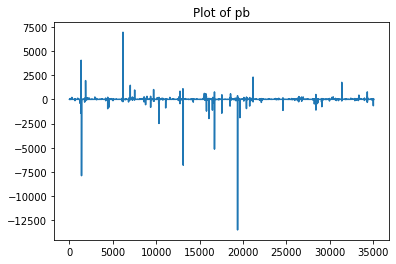

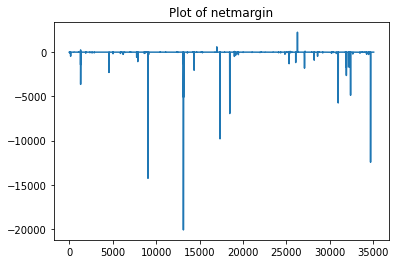

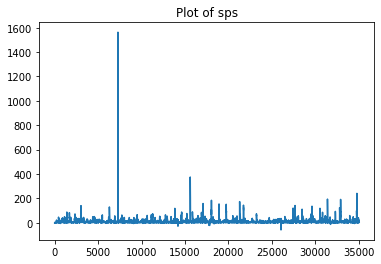

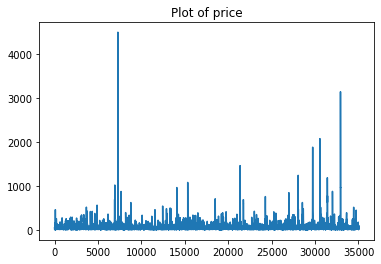

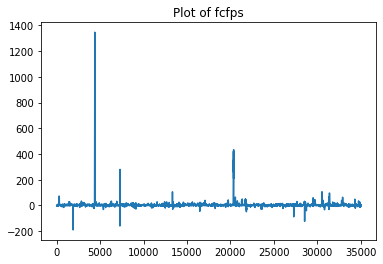

...

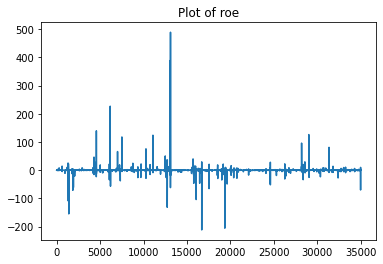

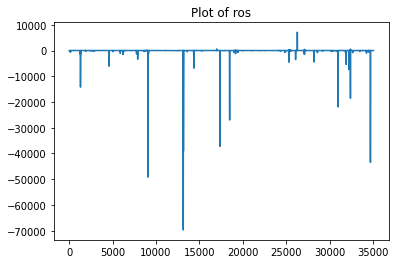

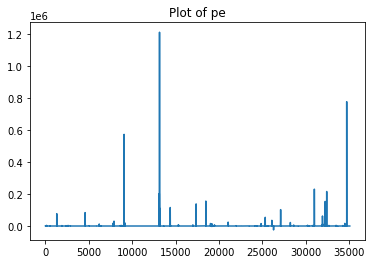

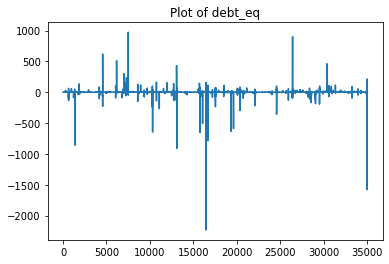

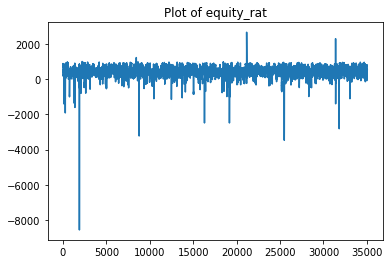

<IPython.core.display.Javascript object>

In [14]:
for col in dfm.columns:
    plt.plot(dfm[col])
    plt.title(f"Plot of {col}")
    plt.show()

In [15]:
# dfp = dfm.sample(100, random_state=55)
# sns.pairplot(dfp, hue="price")
# plt.show()

<IPython.core.display.Javascript object>

## Begin Modeling,
    - Scale Data
        - try PCA / UMAP
    - Cluster with KMeans / DBSCAN
    - Evaluate and Visualize

In [16]:
# Flag to True to drop.
DROP_PRICE = False
DROP_PE = False

if DROP_PRICE:
    dfm = dfm.drop(columns="price", errors="ignore")

if DROP_PRICE:
    dfm = dfm.drop(columns="pe", errors="ignore")

# If I want to run a supervised model on clusters
X = dfm.copy()

<IPython.core.display.Javascript object>

In [17]:
# Scale the df

scaler = StandardScaler()
scaled = scaler.fit_transform(dfm)
scaled = pd.DataFrame(scaled, columns=dfm.columns, index=dfm.index)
scaled.head(2)

,pb,netmargin,sps,price,fcfps,quick,roa,roe,ros,pe,debt_eq,equity_rat
0,0.008101,-0.081110,-0.285589,-0.192542,-0.218118,0.276017,-2.246690,-0.095772,-0.055840,0.054444,-0.021381,1.234688
1,-0.003533,0.025265,-0.280940,-0.263728,-0.216010,0.404370,-1.721764,-0.070138,0.023132,-0.015993,-0.021414,1.418185


<IPython.core.display.Javascript object>

In [18]:
DIM = False
# Flip flag to False to run UMAP on scaled data instead of PCA.

if DIM:
    dim = PCA(3)
    dim_df = dim.fit_transform(scaled)

    variance = dim.explained_variance_ratio_
    var = np.cumsum(np.round(variance, 3) * 100)
    plt.figure(figsize=(12, 6))
    plt.ylabel("% Variance Explained")
    plt.xlabel("# of Features")
    plt.title("PCA Analysis")
    plt.ylim(0, 100.5)
    plt.plot(var)
    print(dim.explained_variance_ratio_)
    print(
        "Total explained variance:",
        dim.explained_variance_ratio_.sum().round(4) * 100,
        "%",
    )

else:
    dim = umap.UMAP(
        n_components=2, n_neighbors=12, min_dist=0.012, metric="correlation"
    ).fit_transform(scaled)

<IPython.core.display.Javascript object>

In [19]:
if DIM:
    dim_df = pd.DataFrame(
        dim_df, columns=['pc' + str(i) for i in range(dim_df.shape[1])], index=dfm.index
    )

else:
    dim_df = pd.DataFrame(
        dim,
        columns=['u' + str(i) for i in range(dim.shape[1])],
        index=dfm.index,
    )


dim_df["ticker"] = dfs["ticker"]
display(dim_df.head(2))



,u0,u1,ticker
0,7.065879,11.731062,ZYME
1,8.006194,11.824404,ZYME


<IPython.core.display.Javascript object>

### Plot Dimension Reduction Method,

In [20]:
if DIM:
    # fig = px.scatter(dim_df, x="pc0", y="pc1", hover_data=["ticker"])
    Scene = dict(
        xaxis=dict(title="pc0"), yaxis=dict(title="pc1"), zaxis=dict(title="pc2")
    )
    trace = go.Scatter3d(
        x=dim_df.iloc[:, 0],
        y=dim_df.iloc[:, 1],
        z=dim_df.iloc[:, 2],
        mode="markers",
        marker=dict(
            colorscale="Greys",
            opacity=0.3,
            size=10,
        ),
    )
    layout = go.Layout(margin=dict(l=0, r=0), scene=Scene, height=1000, width=1000)
    data = [trace]
    fig = go.Figure(data=data, layout=layout)

else:
    fig = px.scatter(
        dim_df,
        x="u0",
        y="u1",
        hover_data=["ticker"],
        title="UMAP Results in Two Dimensions",
    )

fig.show()

<IPython.core.display.Javascript object>

In [21]:
if DIM:
    dim_df = dim_df.drop(columns=["ticker", "label"], errors="ignore")
    dfm = dfm.drop(columns="label", errors="ignore")
    vis_dim = dim.components_.T
    vis_dim = pd.DataFrame(vis_dim, columns=dim_df.columns, index=dfm.columns)
    display(vis_dim.style.background_gradient(axis=1))

else:
    print("Using UMAP, This cell is to better visualize PCA.")

Using UMAP, This cell is to better visualize PCA.


<IPython.core.display.Javascript object>

### Start Clustering 
    - KMeans
    - DBSCAN

In [22]:
# CLST = True, then run KMeans. False = run DBSCAN
CLST = False

# Drop 'ticker' feature for the clustering process.
dim_df = dim_df.drop(columns=["ticker", "calendardate"], errors="ignore")

if CLST:
    for k in range(5, 30, 5):
        pred = KMeans(n_clusters=k, random_state=55).fit_predict(scaled)
        print(
            "Silhouette score for {} cluster k-means: {}".format(
                k, metrics.silhouette_score(scaled, pred, metric="euclidean")
            )
        )
else:
    preds = []
    for k in range(20, 200, 80):
        pred = DBSCAN(eps=0.615, min_samples=k, metric="euclidean").fit_predict(scaled)
        preds.append(metrics.silhouette_score(scaled, pred, metric="euclidean"))
        print(
            "Silhouette score for {} min samples in DBSCAN: {}".format(
                k, metrics.silhouette_score(scaled, pred, metric="euclidean")
            )
        )



Silhouette score for 20 min samples in DBSCAN: 0.4036736459558269
Silhouette score for 100 min samples in DBSCAN: 0.3420964300807505
Silhouette score for 180 min samples in DBSCAN: 0.32729319462989803


<IPython.core.display.Javascript object>

#### Using a higher min sample to give better cluster distribution.  Silhoutte score did not deprecate much in the sample magnitude change, so tuning towards interpretability.
    - KMeans does not do a great job of clustering in comparison, hence why it is flagged. 

In [23]:
# Cluster and display labels and distribution per label
if CLST:
    clst = KMeans(n_clusters=2, random_state=55)
    clst.fit(dim_df)
    print("****Clustered with KMeans****")

else:
    clst = DBSCAN(eps=0.615, min_samples=180, metric="euclidean")
    clst.fit(dim_df)
    print("****Clustered with DBSCAN****")

    # Show the clustering results in a clean way.
labels = pd.Series(clst.labels_)
label_counts = pd.concat(
    (labels.value_counts(normalize=True), labels.value_counts()), axis=1
)
label_counts.columns = ["% of Records", "# of Records"]
label_counts.index.name = "Cluster"
label_counts.sort_values(by="% of Records", ascending=False)

****Clustered with DBSCAN****


,% of Records,# of Records
Cluster,,
2,0.305054,7666
1,0.197811,4971
-1,0.123876,3113
3,0.069598,1749
5,0.053959,1356
10,0.037923,953
0,0.028054,705
6,0.027179,683
4,0.026582,668


<IPython.core.display.Javascript object>

### Visualize Cluster Results
    - Scatter View   

In [24]:
dim_df = dim_df.drop(columns="label", errors="ignore")

<IPython.core.display.Javascript object>

In [25]:
labeled_df = dfs.copy()
labeled_df["label"] = clst.labels_

plot_df = pd.concat((dim_df, labeled_df), axis=1)
plot_df["label"] = plot_df["label"].astype(str)
plot_df["ticker"] = dfs["ticker"]
# plot_df = plot_df.reset_index()


if DIM:
    fig = px.scatter(
        plot_df,
        x="pc0",
        y="pc1",
        color="label",
        hover_data=["ticker", "pb", "price"],
        title="Graph of Stock Clusters (PCA)",
        opacity=0.3,
    )

else:
    no_outliers = plot_df[plot_df["label"] != "-1"]
    fig = px.scatter(
        no_outliers,
        x="u0",
        y="u1",
        color="label",
        hover_data=["ticker", "pb", "price"],
        title="Graph of Stock Clusters (DBSCAN)",
    )

fig.show()

<IPython.core.display.Javascript object>

### Evaluate the clusters further, 

In [26]:
# List of Stocks to animate to show how they move around cluster.

stocks = [
    "T",
    "ADBE",
    "CSTM",
    "BA",
    "WFC",
    "GOOGL",
    "MSFT",
    "CRM",
    "COKE",
    "FB",
    "MSFT",
    "AAPL",
    "NFLX",
    "DNKN",
    "TSLA",
    "PEP",
    "WYNN",
    "CRM",
    "BAC",
    "PG",
    "WMT",
    "JNJ",
    "JPM",
    "V",
    "PYPL",
    "SNAP",
]

<IPython.core.display.Javascript object>

In [27]:
dim_df["label"] = clst.labels_
dim_df["label"] = dim_df["label"].astype(str)
dim_df["ticker"] = dfs["ticker"]
dim_df["calendardate"] = dfs["calendardate"]

dim_df["stock_interest"] = dfs["ticker"].isin(stocks)
dim_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 25130 entries, 0 to 35052
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   u0              25130 non-null  float32
 1   u1              25130 non-null  float32
 2   label           25130 non-null  object 
 3   ticker          25130 non-null  object 
 4   calendardate    25130 non-null  object 
 5   stock_interest  25130 non-null  bool   
dtypes: bool(1), float32(2), object(3)
memory usage: 1006.2+ KB


<IPython.core.display.Javascript object>

In [28]:
dim_df = dim_df.sort_values(by='calendardate', ascending = True)
stock_animation = dim_df[dim_df["stock_interest"] == 1]


fig = px.scatter(
   stock_animation,
    x="u0",
    y="u1",
    text="ticker",
    color="label",
    animation_group="ticker",
    animation_frame="calendardate",
    title = 'Stock Animation To Visualize How Stocks May Change Clusters',
    
)

# Add Trace of Clusters underneath animation.
fig.add_scatter(
    x=dim_df["u0"],
    y=dim_df["u1"],
    mode  = 'markers',
    hoverinfo = 'text',
    hovertextsrc = 'hover',
    hovertext = dim_df['ticker'],
    opacity = .3,
)



# change speed in animation frame change
fig.layout.updatemenus[0].buttons[0].args[1]["frame"]["duration"] = 1500
# change speed in animation transition change
fig.layout.updatemenus[0].buttons[0].args[1]['transition']['duration'] = 1500



<IPython.core.display.Javascript object>

#### A visualization of notable stocks moving around clusters in time,

In [29]:
fig.show()

<IPython.core.display.Javascript object>

### Visualize Stock Animations Prices Over Time for Intuition of Cluster Map Shifts,

In [30]:
df_stocks = df.loc[:, ("ticker", "price", "pb", "calendardate")]
df_stocks["in_list"] = df["ticker"].isin(stocks)
df_stocks = df_stocks[df_stocks["in_list"] == 1]
df_stocks["calendardate"] = pd.to_datetime(df_stocks["calendardate"])
df_stocks = df_stocks.sort_values(by=["ticker", "calendardate"])

melted = pd.melt(df_stocks, id_vars=["price", "calendardate"], value_vars="ticker")
melted

px.line(
    melted,
    x="calendardate",
    y="price",
    color="value",
    title="Stock Prices Over Time ($)",
)

<IPython.core.display.Javascript object>

### Visualize Clusters by Gradient View >> Then Evaluate Per Cluster,
    - Run TTests to see Statistically relevant Features per cluster.
        - Use main_features()
    - Look at top 5 and bottom 5 stocks by feature.
    - See the stability of Stocks staying in clusters
    

In [31]:
# Look at dfm with labels
labeled_df = dfs.copy()
labeled_df["label"] = clst.labels_

# Change var to sort by different feature.
var = "pb"

clst_avgs = labeled_df.groupby("label", as_index=False).median()
clst_avgs["%_of_Records"] = label_counts["% of Records"]
clst_avgs = clst_avgs[clst_avgs["label"] != -1]
clst_avgs = clst_avgs[clst_avgs["%_of_Records"] > 0.03]
clst_avgs = clst_avgs.sort_values(by=var)

# Using .head to look at biggest clusters for easier interpretabiliy.
# remove .head for more precision and to understand outlier/smaller clsts.
print("Cluster Avgs by Original DF, and Over 3% Representation of Indices:")
display(clst_avgs.style.background_gradient())

scaled_df = scaled.copy()
scaled_df["label"] = clst.labels_
# scaled_df = scaled_df[scaled_df["label"] != -1]

sclst = scaled_df.groupby("label", as_index=False).median().sort_values(by=var)
sclst["%_of_Records"] = label_counts["% of Records"]
sclst = sclst[sclst["label"] != -1]
sclst = sclst[sclst["%_of_Records"] > 0.03]
print("\n", "Clusters by Scaled DF, and Over 3% Representation of Indices:")
sclst.style.background_gradient()

Cluster Avgs by Original DF, and Over 3% Representation of Indices:


,label,revenue,pb,debt,assets,netmargin,ncfo,shareswa,sps,opinc,assetsc,liabilitiesc,price,sharesbas,equity,receivables,investmentsc,cashneq,assetsavg,netinccmn,fcfps,quick,roa,roe,ros,pe,debt_eq,equity_rat,%_of_Records
10,9,26.585758,2.030000,27.326090,79.067065,0.026500,156400000.000000,140353010.000000,26.405000,1.213506,26.939767,21.292454,40.345000,140246168.500000,21.366128,8.616798,0.000000,3.547913,76.653543,2.603337,2.779000,0.676076,35.081695,0.126289,0.102305,1.600392,1.403537,273.580206,0.037923
3,2,4.716017,2.930500,4.461231,26.149934,0.082000,52851500.000000,74200000.000000,4.712000,0.591329,9.256486,4.032939,44.980000,74732782.000000,14.869982,2.506345,0.000000,2.281539,25.223305,1.720737,1.828000,1.614489,65.727854,0.117988,0.325355,9.453458,0.319816,567.735261,0.069598
2,1,6.739277,4.149000,22.755296,50.552749,0.067000,150755000.000000,148552106.000000,6.761000,0.878331,10.625861,9.116873,46.660000,155253167.000000,9.958601,3.482703,0.000000,2.013284,48.927762,1.940217,2.129000,0.845200,35.097452,0.156353,0.266371,6.543866,2.098407,215.833801,0.305054
1,0,0.208103,4.740000,0.282306,7.588928,-2.765000,-19838000.000000,52689000.000000,0.217000,-0.506130,6.301206,0.690420,27.710000,52833604.000000,5.755173,0.124778,2.555301,2.038088,6.801311,-1.829957,-1.587000,8.452725,-276.845062,-0.348486,-9.692257,123.336047,0.058699,785.503794,0.197811
5,4,19.512084,5.769500,35.944929,105.757143,0.107000,328725000.000000,116750000.000000,19.512000,2.944315,31.609153,22.867628,183.020000,115895463.000000,31.415516,9.859529,0.000000,6.150327,104.042953,7.927469,8.401000,0.882735,78.218698,0.248443,0.394434,9.935465,1.167273,303.955817,0.053959



 Clusters by Scaled DF, and Over 3% Representation of Indices:


,label,pb,netmargin,sps,price,fcfps,quick,roa,roe,ros,pe,debt_eq,equity_rat,%_of_Records
10,9,-0.013257,0.039178,0.355882,-0.234773,-0.026608,-0.142733,0.120966,0.014225,0.039653,-0.029784,0.029488,-0.427773,0.037923
3,2,-0.006593,0.039421,-0.172158,-0.203379,-0.058940,-0.049877,0.297523,0.012760,0.039915,-0.029046,-0.010305,0.585417,0.069598
2,1,0.002424,0.039355,-0.122282,-0.192000,-0.048707,-0.125998,0.121057,0.019530,0.039845,-0.029319,0.055003,-0.626675,0.305054
1,0,0.006798,0.026959,-0.281573,-0.320353,-0.175042,0.626762,-1.676084,-0.069555,0.028164,-0.018335,-0.019893,1.335501,0.197811
5,4,0.014417,0.039531,0.188096,0.731597,0.164527,-0.122284,0.369484,0.035781,0.039996,-0.029000,0.020813,-0.323147,0.053959


<IPython.core.display.Javascript object>

#### The Largest Clusters in the Group are : 7, 10, 1, 6, 0, 3, 6
    - The Next cell will showcase the most statistically relevant features per Cluster.
    - Then You will see the ticker symbols, stability over time, and top and bottom stocks by signaled feature per cluster. 

In [32]:
# Type in Cluster # to see which features are statistically significant.
### Need to debug before production.
for nclust in list([10, 5, 7, 1, 6, 0, 3, 6]):
    print(main_features(nclust), "\n-----------------------------\n")

Reviewing cluster number: 10 
 
Features that are statistically significant;

netmargin
sps
price
fcfps
quick
roa
roe
ros
pe
debt_eq
equity_rat
None 
-----------------------------

Reviewing cluster number: 5 
 
Features that are statistically significant;

pb
netmargin
sps
price
fcfps
quick
roa
roe
ros
pe
equity_rat
None 
-----------------------------

Reviewing cluster number: 7 
 
Features that are statistically significant;

pb
netmargin
sps
price
fcfps
quick
roa
roe
ros
pe
debt_eq
equity_rat
None 
-----------------------------

Reviewing cluster number: 1 
 
Features that are statistically significant;

pb
netmargin
sps
price
fcfps
quick
roa
roe
ros
pe
debt_eq
equity_rat
None 
-----------------------------

Reviewing cluster number: 6 
 
Features that are statistically significant;

pb
netmargin
sps
price
fcfps
quick
roa
roe
ros
pe
debt_eq
equity_rat
None 
-----------------------------

Reviewing cluster number: 0 
 
Features that are statistically significant;

netmargin
sps
pric

<IPython.core.display.Javascript object>

In [33]:
# To see other clusters use - fyi_cluster(cluster_num, feat)
for nclust in list([10, 5, 7, 1, 6, 0]):
    print(fyi_cluster(nclust, "equity_rat"))

-----------------------
 Now Presenting Details for Cluster 10

These are the stock symbols for the cluster:


array(['XPO', 'WMT', 'WHR', 'WCC', 'WBA', 'VMI', 'VLO', 'VIAC', 'USFD',
       'UNH', 'UNFI', 'THS', 'THO', 'TGT', 'SUN', 'SNX', 'SEB', 'SAIC',
       'SAH', 'PVH', 'PSX', 'PFGC', 'PBF', 'PATK', 'PAG', 'ODP', 'NSIT',
       'MUSA', 'MPC', 'MOH', 'MGLN', 'MCK', 'MAN', 'LH', 'LEA', 'LAD',
       'KWR', 'KSS', 'KR', 'JLL', 'J', 'INT', 'HUM', 'HII', 'GPI', 'GHC',
       'FLR', 'FDX', 'EME', 'DY', 'CVS', 'COST', 'CORE', 'COKE', 'CNC',
       'CMI', 'CI', 'CASY', 'CAH', 'CACI', 'BIG', 'BG', 'BECN', 'BCC',
       'BBY', 'AVT', 'ARW', 'ANTM', 'AN', 'AMWD', 'AHCO', 'AGCO', 'ADNT',
       'ACM', 'ABG', 'ABC', 'AAP'], dtype=object)


 Each Ticker that has less than 19 has moved clusters from here:


UNH     19
MCK     19
MOH     19
ANTM    19
CVS     19
CASY    19
CORE    19
CAH     19
ABC     19
AN      19
Name: ticker, dtype: int64


 Top 5 and Bottom 5 by equity_rat:


,7295,7294,7299,7296,7297
ticker,SEB,SEB,SEB,SEB,SEB
revenue,1214.81,1197.73,1159.28,1195.16,1172.95
pb,1.415,1.559,1.119,1.504,1.463
debt,559.566,544.189,533.083,562.983,544.189
assets,4153.6,4265.52,3781.98,4107.47,4062.19
netmargin,0.041,0.058,0.059,0.061,0.075
ncfo,1.83e+08,2.1e+07,1.29e+08,-6e+06,1.28e+08
shareswa,1.17055e+06,1.17055e+06,1.17055e+06,1.17055e+06,1.17055e+06
sps,1214.81,1197.73,1159.28,1195.16,1172.95
opinc,46.9865,62.3638,64.9267,58.0923,64.9267



 Bottom 5 stocks by equity_rat in cluster:


,29633,29635,29636,29637,34806
ticker,CAH,CAH,CAH,CAH,ABC
revenue,133.328,134.099,136.079,126.152,241.3
pb,9.656,11.628,14.809,15.632,-19.418
debt,23.0034,24.8699,27.1712,26.9966,20.1857
assets,142.413,140.918,140.555,132.361,216.947
netmargin,-0.006,0.009,0.006,-0.132,-0.098
ncfo,2.7e+08,1.676e+09,6.97e+08,-6.53e+08,1.29923e+09
shareswa,2.93e+08,2.92e+08,2.92e+08,2.96e+08,2.04081e+08
sps,133.328,134.099,136.079,126.152,241.3
opinc,-2.1058,1.85959,1.18493,-17.8311,-29.9545


None
-----------------------
 Now Presenting Details for Cluster 5

These are the stock symbols for the cluster:


array(['ZM', 'ZBRA', 'ZBH', 'XEC', 'WWD', 'WST', 'WSO', 'WDFC', 'WCN',
       'WAT', 'WAB', 'VRTX', 'VMW', 'VMC', 'VEEV', 'VAR', 'V', 'USPH',
       'ULTA', 'UHS', 'TYL', 'TTWO', 'TTD', 'TREE', 'TMO', 'TIF', 'TFX',
       'TEL', 'TECH', 'TDY', 'TAP', 'SYK', 'SWK', 'STZ', 'STMP', 'STE',
       'SRCL', 'SPOT', 'SNPS', 'SNA', 'SJM', 'SITE', 'SHOP', 'SGEN',
       'SEDG', 'SAM', 'ROP', 'ROKU', 'ROG', 'RNG', 'RMD', 'REGN', 'RCL',
       'QRVO', 'QDEL', 'PXD', 'PVH', 'PTON', 'PTC', 'PRGO', 'POOL', 'PKI',
       'PKG', 'PG', 'PEN', 'PAYC', 'OSIS', 'OLED', 'OFLX', 'NXPI', 'NVDA',
       'NSC', 'NOW', 'NDSN', 'NBIX', 'MTN', 'MTCH', 'MSTR', 'MSGS',
       'MSFT', 'MSA', 'MPWR', 'MORN', 'MLM', 'MLAB', 'MIDD', 'MHK', 'MED',
       'MASI', 'LULU', 'LRCX', 'LOGM', 'LIVN', 'LIN', 'LHX', 'LHCG', 'LH',
       'LGND', 'LFUS', 'KWR', 'KSU', 'KEYS', 'KAI', 'JNJ', 'JLL', 'JKHY',
       'JJSF', 'JBHT', 'JAZZ', 'J', 'ISRG', 'IPGP', 'INTU', 'INGR',
       'ILMN', 'IFF', 'IEX', 'ICUI', 'HUBB', 'HELE', 'HEI', '


 Each Ticker that has less than 19 has moved clusters from here:


BIIB    19
APD     19
CSGP    19
CRM     19
COO     19
MLM     19
TMO     19
REGN    19
SJM     19
FFIV    19
Name: ticker, dtype: int64


 Top 5 and Bottom 5 by equity_rat:


,26999,26996,26997,26995,32008
ticker,CSGP,CSGP,CSGP,CSGP,ATRI
revenue,7.11958,8.4565,8.2338,8.73287,18.8484
pb,4.048,5.23,5.268,4.066,6.514
debt,0,0,0,0.110693,0
assets,80.5449,88.7714,86.5626,91.6802,124.779
netmargin,0.174,0.192,0.148,0.265,0.222
ncfo,7.1396e+07,1.01367e+08,4.6332e+07,1.14774e+08,1.0545e+07
shareswa,3.5675e+07,3.6129e+07,3.6073e+07,3.6136e+07,1.853e+06
sps,7.12,8.457,8.234,8.733,18.848
opinc,1.42279,1.95654,1.21348,2.92387,4.48894



 Bottom 5 stocks by equity_rat in cluster:


,16246,3669,12892,16247,11202
ticker,LRCX,TTD,NOW,LRCX,PAYC
revenue,19.2153,4.79417,5.04022,17.2306,3.1543
pb,8.49,19.142,25.022,7.737,30.963
debt,39.9929,4.20598,5.98864,35.0055,0.551765
assets,100.204,38.3802,31.8924,89.0471,33.3779
netmargin,0.25,0.236,0.629,0.23,0.157
ncfo,8.13048e+08,-2.8068e+07,4.21211e+08,5.41428e+08,2.5482e+07
shareswa,1.45294e+08,4.5043e+07,1.88836e+08,1.45301e+08,5.7568e+07
sps,19.215,4.794,5.04,17.231,3.154
opinc,5.20133,1.16888,0.150988,4.77708,0.461645


None
-----------------------
 Now Presenting Details for Cluster 7

These are the stock symbols for the cluster:


array(['YETI', 'XYL', 'WWD', 'WTRG', 'WAB', 'VRSK', 'VMW', 'VFC', 'USPH',
       'UNP', 'UI', 'TTWO', 'TTD', 'TTC', 'TRU', 'TRP', 'TCP', 'STNE',
       'SR', 'SMG', 'SJI', 'SBUX', 'RSG', 'ROST', 'ROK', 'RCL', 'RBA',
       'PYPL', 'PSXP', 'PRAH', 'PNR', 'PEG', 'PCAR', 'PAYX', 'OTTR',
       'OKE', 'OGS', 'OGE', 'NWL', 'NWE', 'NUAN', 'NSC', 'NS', 'NRC',
       'NKE', 'NJR', 'NGVT', 'NFG', 'NEE', 'NDSN', 'NDAQ', 'NCLH', 'MTX',
       'MSFT', 'MSEX', 'MSA', 'MRK', 'MPLX', 'MO', 'MMP', 'MMC', 'MKC',
       'MIDD', 'MIC', 'MGEE', 'MA', 'LVS', 'LLY', 'LECO', 'KLAC', 'JCOM',
       'JBHT', 'ITW', 'INTU', 'IDCC', 'HSIC', 'HOLX', 'HAS', 'GO', 'GNRC',
       'GILD', 'GDOT', 'FTV', 'FTS', 'FTNT', 'FND', 'FMC', 'FLS', 'FIVE',
       'FISV', 'EXP', 'EVR', 'EPC', 'EMR', 'EL', 'EEFT', 'DOV', 'CTXS',
       'CTLT', 'CSX', 'CSCO', 'CROX', 'CRL', 'CRI', 'CR', 'CLR', 'CHDN',
       'CHD', 'CE', 'CATM', 'BSX', 'BR', 'BMY', 'BFAM', 'AZPN', 'AWR',
       'APH', 'APA', 'ALK', 'ALE', 'ALB', 'ACN', 'ACMR', 'AC


 Each Ticker that has less than 19 has moved clusters from here:


AWR     19
RSG     19
OTTR    19
PAYX    19
MMP     18
MSEX    17
EVR     16
GILD    12
LECO    12
MMC     12
Name: ticker, dtype: int64


 Top 5 and Bottom 5 by equity_rat:


,19410,19407,19411,23846,18180
ticker,IDCC,IDCC,IDCC,EVR,JCOM
revenue,7.98845,2.80403,6.07663,10.2557,6.09715
pb,4.234,3.122,4.471,4.859,3.905
debt,7.93457,8.11818,7.84268,10.9434,21.0491
assets,50.3997,55.7816,42.0901,45.5574,52.43
netmargin,0.498,0.365,0.502,0.162,0.105
ncfo,2.33295e+08,1.04749e+08,-1.0128e+07,-4.12748e+08,8.7823e+07
shareswa,3.4283e+07,3.4709e+07,3.428e+07,4.0497e+07,4.801e+07
sps,7.988,2.804,6.077,10.256,6.097
opinc,6.10066,1.17765,4.5717,2.06954,1.18844



 Bottom 5 stocks by equity_rat in cluster:


,28676,3133,12877,3134,3132
ticker,CHDN,UI,NRC,UI,UI
revenue,4.37182,4.039,1.0856,4.31416,4.08483
pb,9.595,56.129,49.491,56.183,93.49
debt,20.4758,6.61293,1.34086,6.63502,7.05944
assets,36.9746,13.1918,3.8278,13.1458,12.4817
netmargin,0.961,0.31,0.255,0.253,0.247
ncfo,5.59e+07,1.3671e+07,1.3912e+07,5.0642e+07,1.01004e+08
shareswa,4.33e+07,7.054e+07,2.8223e+07,7.1225e+07,7.0172e+07
sps,4.372,4.039,1.086,4.314,4.085
opinc,0.454965,1.44793,0.332885,1.28687,1.43768


None
-----------------------
 Now Presenting Details for Cluster 1

These are the stock symbols for the cluster:


array(['ZTS', 'ZBRA', 'YUM', 'YETI', 'XYL', 'XRX', 'XEL', 'X', 'WYNN',
       'WYND', 'WWW', 'WWE', 'WTRG', 'WSM', 'WSC', 'WMS', 'WMB', 'WM',
       'WLK', 'WHD', 'WH', 'WES', 'WEN', 'WEC', 'WAT', 'WAB', 'W', 'VZ',
       'VST', 'VSLR', 'VRT', 'VRSK', 'VRRM', 'VMW', 'VIAC', 'VFC', 'VC',
       'URI', 'UPS', 'UNVR', 'UGI', 'UAL', 'TWNK', 'TU', 'TTWO', 'TTEC',
       'TTD', 'TT', 'TSLA', 'TSCO', 'TRU', 'TRP', 'TROX', 'TREX', 'TPX',
       'TNET', 'TNC', 'TMUS', 'TJX', 'TGNA', 'TEX', 'TEVA', 'TERP', 'TDC',
       'TCP', 'T', 'SYY', 'SYNH', 'SWX', 'SWN', 'SWM', 'SWCH', 'SUM',
       'STX', 'ST', 'SSNC', 'SRE', 'SR', 'SQ', 'SPXC', 'SPR', 'SPGI',
       'SPB', 'SON', 'SO', 'SNBR', 'SMG', 'SLGN', 'SKYW', 'SJW', 'SJI',
       'SITE', 'SIRI', 'SHLX', 'SHEN', 'SHAK', 'SFM', 'SEM', 'SEE',
       'SEAS', 'SBUX', 'SBGI', 'SAVE', 'SAIC', 'SABR', 'RXN', 'RUN',
       'RTX', 'RTLR', 'RRR', 'RPM', 'RPAY', 'ROST', 'ROK', 'RL', 'RH',
       'RCM', 'RCL', 'QSR', 'QRTEA', 'QDEL', 'QCOM', 'PZZA', 'PYPL',
  


 Each Ticker that has less than 19 has moved clusters from here:


CWT     19
CWEN    19
AEE     19
PNM     19
POR     19
BLL     19
PNW     19
SWX     19
EXC     19
IP      19
Name: ticker, dtype: int64


 Top 5 and Bottom 5 by equity_rat:


,27279,11067,27280,11105,20060
ticker,CR,PCAR,CR,PBH,HRC
revenue,11.6958,14.233,11.8067,4.71731,10.599
pb,3.457,2.899,3.583,1.43,3.222
debt,12.5361,29.9666,12.5328,31.5326,28.2219
assets,60.6235,78.5285,59.3916,68.2358,70.1957
netmargin,0.098,0.078,0.099,0.188,0.06
ncfo,1.038e+08,8.317e+08,6.69e+07,5.2139e+07,1.669e+08
shareswa,5.95e+07,3.468e+08,5.95e+07,5.033e+07,6.6544e+07
sps,11.696,14.233,11.807,4.717,10.599
opinc,1.71597,1.48702,1.77815,1.4485,0.99483



 Bottom 5 stocks by equity_rat in cluster:


,31359,14198,1850,14197,1849
ticker,BA,MSGS,W,MSGS,W
revenue,24.9541,-27.6463,45.3917,2.37046,40.2585
pb,-7.891,-17.026,-23.75,-14.871,-19.019
debt,107.587,44.4595,30.0667,44.5045,39.108
assets,284.612,51.3526,46.1807,50.676,47.7959
netmargin,-0.032,0.118,0.064,-0.498,0.045
ncfo,-4.819e+09,-1.07565e+08,1.13525e+09,-5.7485e+07,3.31027e+08
shareswa,5.666e+08,2.4026e+07,9.4834e+07,2.4062e+07,9.5373e+07
sps,24.954,-27.646,45.392,2.37,40.258
opinc,-0.898341,2.07334,3.1634,-1.13889,2.32617


None
-----------------------
 Now Presenting Details for Cluster 6

These are the stock symbols for the cluster:


array(['YUM', 'WW', 'WING', 'VVV', 'VRSN', 'VGR', 'UI', 'SNBR', 'SIX',
       'SIRI', 'SHLX', 'SGMS', 'SEE', 'SBUX', 'SBH', 'SBAC', 'RH', 'RETA',
       'PZZA', 'PSN', 'PPD', 'PM', 'PLNT', 'PINC', 'PENN', 'OPCH', 'NRG',
       'NLOK', 'NAV', 'MTOR', 'MTCH', 'MSI', 'MIK', 'MCO', 'MAS', 'MAR',
       'LW', 'LPRO', 'LNTH', 'LB', 'JACK', 'IT', 'IRWD', 'IQV', 'INVA',
       'INSG', 'IBP', 'IAA', 'HRB', 'HPQ', 'HLT', 'HLF', 'HCA', 'GCP',
       'FUN', 'FTDR', 'FISV', 'EVOP', 'EAT', 'EAF', 'DPZ', 'DNKN', 'DKNG',
       'DELL', 'CWST', 'CR', 'CMPR', 'CLF', 'CHH', 'CDK', 'CCOI', 'BURL',
       'BJ', 'AZPN', 'AVEO', 'ANGI', 'ABBV', 'AAL'], dtype=object)


 Each Ticker that has less than 19 has moved clusters from here:


PM      19
DPZ     19
WW      19
EAT     19
VGR     19
JACK    19
DNKN    19
MIK     19
NAV     19
VRSN    19
Name: ticker, dtype: int64


 Top 5 and Bottom 5 by equity_rat:


,27282,19528,22976,20138,23866
ticker,CR,IBP,FISV,HPQ,EVOP
revenue,11.5313,14.264,3.85223,8.6892,7.1543
pb,3.731,9.968,14.051,-29.921,-41.179
debt,12.6108,21.1594,35.0471,3.82718,34.4319
assets,58.0034,39.535,50.0382,23.5352,72.7838
netmargin,-0.094,0.067,0.147,0.061,-0.027
ncfo,1.497e+08,3.8359e+07,2.06e+08,-5.1e+08,1.3565e+08
shareswa,5.91e+07,2.94788e+07,3.925e+08,1.435e+09,2.10814e+07
sps,11.531,14.264,3.852,8.689,7.154
opinc,-1.78003,1.54056,0.978344,0.57561,-0.265636



 Bottom 5 stocks by equity_rat in cluster:


,25490,25493,25489,25494,25492
ticker,DPZ,DPZ,DPZ,DPZ,DPZ
revenue,18.7703,20.3847,26.0162,13.3382,18.2567
pb,-4.141,-3.021,-3.42,-3.253,-3.519
debt,82.9532,72.1133,84.9048,65.4924,73.2139
assets,21.783,19.1327,21.8149,16.9149,18.5572
netmargin,0.107,0.105,0.103,0.088,0.113
ncfo,1.07807e+08,1.13162e+08,1.31652e+08,1.15329e+08,8.3676e+07
shareswa,4.18727e+07,4.37341e+07,4.15947e+07,4.82554e+07,4.30182e+07
sps,18.77,20.385,26.016,13.338,18.257
opinc,5.13246,4.00719,7.03321,2.42626,5.01385


None
-----------------------
 Now Presenting Details for Cluster 0

These are the stock symbols for the cluster:


array(['ZYME', 'ZGNX', 'ZG', 'XPER', 'XLRN', 'XEC', 'VXRT', 'VIR', 'VIE',
       'VCYT', 'VBIV', 'VAPO', 'URGN', 'TXG', 'TWTR', 'TWST', 'TPTX',
       'TNDM', 'TDOC', 'TBPH', 'TBIO', 'SWAV', 'SRRA', 'SRPT', 'SPCE',
       'SNDX', 'SNAP', 'SILK', 'SGMO', 'SAGE', 'RVNC', 'RVMD', 'RMBS',
       'RGNX', 'RDFN', 'RCUS', 'RARE', 'RAPT', 'QURE', 'QTWO', 'PTCT',
       'PRNB', 'PINS', 'PDCE', 'PD', 'PCRX', 'ONEM', 'NXTC', 'NVTA',
       'NVRO', 'NVCR', 'NTRA', 'NTLA', 'NKTR', 'NKLA', 'NET', 'NBIX',
       'MYOK', 'MTSI', 'MRTX', 'MRSN', 'MRNA', 'MOR', 'MNTA', 'MGNX',
       'LITE', 'LBRDA', 'KPTI', 'ITCI', 'IRTC', 'INSP', 'INO', 'IDRA',
       'ICPT', 'HRTX', 'HCAT', 'GWPH', 'GLIBA', 'GKOS', 'GH', 'GBT',
       'FSLY', 'FOLD', 'FGEN', 'FATE', 'EXAS', 'ESPR', 'EPZM', 'EIDX',
       'EGHT', 'EDIT', 'DXCM', 'DVAX', 'DRNA', 'DNLI', 'DCPH', 'CYRX',
       'CSII', 'CRSP', 'CLLS', 'CGC', 'CDNA', 'CCXI', 'CALA', 'BPMC',
       'BLUE', 'BGNE', 'BBIO', 'BB', 'AXNX', 'AVCO', 'AUPH', 'ATRC',
       'ASND'


 Each Ticker that has less than 19 has moved clusters from here:


SGMO    19
XLRN    19
BLUE    19
NTLA    17
ALNY    17
ASND    16
BPMC    16
RGNX    15
ACAD    15
CYRX    15
Name: ticker, dtype: int64


 Top 5 and Bottom 5 by equity_rat:


,18478,8648,4179,12215,34243
ticker,ITCI,RGNX,TPTX,NXTC,ADVM
revenue,0.0026426,0.0149276,0.592616,0.813541,0.00376176
pb,1.588,1.363,5.251,3.074,1.466
debt,0,0,0.0982321,0.171702,0
assets,8.05023,8.16591,17.1772,12.4867,4.47854
netmargin,-154.79,-27.399,-0.708,0.435,-79.63
ncfo,-2.48883e+07,-7.887e+06,1.742e+06,-1.0594e+07,-1.2984e+07
shareswa,4.34198e+07,2.6327e+07,4.21858e+07,2.75069e+07,5.742e+07
sps,0.003,0.015,0.593,0.814,0.004
opinc,-0.428802,-0.427356,-0.43946,0.298543,-0.312539



 Bottom 5 stocks by equity_rat in cluster:


,10972,13942,25260,25261,25262
ticker,PD,MTSI,DXCM,DXCM,DXCM
revenue,0.643783,2.58983,2.11226,2.54315,2.12918
pb,7.017,3.686,15.299,11.892,11.029
debt,3.11162,10.685,3.79496,3.76985,3.73702
assets,9.12964,25.4829,10.2726,10.4039,9.72203
netmargin,-0.29,-0.064,-0.131,-0.043,-0.011
ncfo,2.047e+06,1.2361e+07,-8.7e+06,4.12e+07,3.62e+07
shareswa,7.8775e+07,6.4244e+07,8.73e+07,8.69e+07,8.67e+07
sps,0.644,2.59,2.112,2.543,2.129
opinc,-0.170727,0.00538572,-0.351661,0.13809,-0.00576701


None


<IPython.core.display.Javascript object>

### Cluster Characteristics 
 - Let's look more closely at clusters 10 and 5. They both contain a lot of technology stocks and are smaller clusters. 
 - We will filter a df by statistically relevant features, and then compare the two clusters. 

In [34]:
comps = labeled_df.groupby("label", as_index=False).median()
comps = comps[
    [
        "label",
        "pb",
        "netmargin",
        "sps",
        "fcfps",
        "roa",
        "roe",
        "ros",
        "pe",
        "debt_eq",
        "equity_rat",
    ]
]
labels = [5, 10]
comps = comps[comps["label"].isin(labels)]
comps.style.background_gradient()

,label,pb,netmargin,sps,fcfps,roa,roe,ros,pe,debt_eq,equity_rat
6,5,4.700000,0.129000,10.502500,6.043000,81.028530,0.159057,0.488184,16.299510,0.442009,518.312444
11,10,1.991000,0.021000,64.665000,5.398000,38.499948,0.119389,0.079024,1.244679,0.800499,320.533697


<IPython.core.display.Javascript object>

#### Cluster 5 - Has higher pb, sps, fcfps, and debt equity ratios. 
    - notable tickers = WIX, WKDY, ZEN, DOCU, ADSK
    - The higher pb suggests higher market speculation of value vs book value. 
    - the debt equity shows more leverage in the cluster. 
    - The sps and free cash flow show reason for the higher pb as the sales per share and litquitidy are healther. 
    - Lots of subscription based revenue models.
    
#### Cluster 10 - Has higher net margin, return on assets, return on equity, return on sales, price / earnings, and equity ratio. 
    - Notable tickers = YELP, TWLO, CHGG, FSLY, CRON, DKNG, HP
    - These companies share less leveraged attributes than cluster 5.  As they tend to be in industries that need more financial accountability or have less predictable revenue trends than subscription. If subscription, they may experience more churn or set up revenue.
    - These companies do tend to get better returns on their assets, equity, and sales. 
    - They also have more ownership of their equity. 

### Run a Supervised Classification Model,
    - Use XGBoost to see how well we could predict clusters if we were to add new stocks or quarters of stocks. 

In [35]:
import warnings

warnings.filterwarnings("ignore")

# How likely would we be able to predict which cluster a new stock
# added to the model would fall into?
y = clst.labels_

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)

pipeline = Pipeline(
    [
        ("scale", StandardScaler()),
        ("xgb", XGBClassifier(n_estimators=1000, learning_rate=0.001)),
        # ("rf", RandomForestClassifier(max_depth=3)),
    ]
)
pipeline.fit(X_train, y_train)

print(f"Train score: {pipeline.score(X_train, y_train)}")
print(f"Test score: {pipeline.score(X_test, y_test)}")

y_pred = pipeline.predict(X_test)

confusion_mat = confusion_matrix(y_test, y_pred)

[09:22:59] WARNING: /Users/travis/build/dmlc/xgboost/src/learner.cc:1061: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'multi:softprob' was changed from 'merror' to 'mlogloss'. Explicitly set eval_metric if you'd like to restore the old behavior.
Train score: 0.9097194588141664
Test score: 0.8752487067250299


<IPython.core.display.Javascript object>

#### To give more interpretability, set the confusion matrix for the clusters over 3% of index,


In [36]:
confusion_mat = pd.DataFrame(
    confusion_mat,
    columns=["Predicted" + str(i) for i in set(y_test)],
    index=["Actual" + str(i) for i in set(y_test)],
)

clusters = 7, 10, 1, 6, 0, 3, 6

clst_confusion_mat = pd.DataFrame(
    confusion_mat,
    columns=["Predicted" + str(i) for i in set(clusters)],
    index=["Actual" + str(i) for i in set(clusters)],
)

# Unhash if you want to see large version.
# confusion_mat
clst_confusion_mat

,Predicted0,Predicted1,Predicted3,Predicted6,Predicted7,Predicted10
Actual0,352,11,94,36,5,0
Actual1,9,126,0,0,0,0
Actual3,5,0,1493,14,0,0
Actual6,1,0,9,251,0,0
Actual7,0,0,0,0,136,0
Actual10,0,0,0,0,0,64


<IPython.core.display.Javascript object>

#### The predictiveness seems to be pretty strong in the clusters of interest and fairly aligned to the the train and test scores. I think this is a decent model for a first pass. 

In [37]:
# Check feature importance in the case of tuning further.

feature_importance = pipeline["xgb"].feature_importances_
feature_importance = pd.DataFrame(
    {"feature": X_train.columns, "importance": feature_importance}
)
feature_importance.sort_values(by="importance", ascending=False)

,feature,importance
11,equity_rat,0.214826
6,roa,0.165783
3,price,0.101211
2,sps,0.098681
10,debt_eq,0.095343
7,roe,0.076372
5,quick,0.066570
8,ros,0.054985
0,pb,0.037868
9,pe,0.037302


<IPython.core.display.Javascript object>